# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # visualization library
import matplotlib.pyplot as plt # visualization library
from plotly.offline import init_notebook_mode, iplot # plotly offline mode
import plotly.graph_objs as go # plotly graphical object


import src.data.timeseries_eda as eda 

init_notebook_mode(connected=True)
# ignore filters
warnings.filterwarnings("ignore") # if there is a warning after some codes, this will avoid us to see them.
plt.style.use('ggplot')

# config

In [3]:
symbol = 'EURUSD'

# EDA

In [4]:
market_data = pd.read_csv(f'data/{symbol}_1h.csv')
market_data.head()

,Unnamed: 0,open_time,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,close_time,month,year
0,0,2015-02-02 01:00:00,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.70,2015-02-02 02:00:00,2,2015
1,1,2015-02-02 02:00:00,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.25,2015-02-02 03:00:00,2,2015
2,2,2015-02-02 03:00:00,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.55,2015-02-02 04:00:00,2,2015
3,3,2015-02-02 04:00:00,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.47,2015-02-02 05:00:00,2,2015
4,4,2015-02-02 05:00:00,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.40,2015-02-02 06:00:00,2,2015


In [5]:
market_data['open_time'] = pd.to_datetime(market_data['open_time'])
market_data.set_index('open_time', inplace=True)

market_data.drop(columns='close_time', inplace=True)

In [6]:
stationary = eda.Stationary(market_data)

for feature in market_data.columns:
    stationary.check(feature)
    print('-'*20)

checking stationarity for Unnamed: 0
ADF Statistic: -180.97297030887822
p-value: 0.0
Is stationary: True
--------------------
checking stationarity for open_bid
ADF Statistic: -2.4627539457924263
p-value: 0.124801643948242
Is stationary: False
--------------------
checking stationarity for low_bid
ADF Statistic: -2.4987771684525986
p-value: 0.1157721364524879
Is stationary: False
--------------------
checking stationarity for high_bid
ADF Statistic: -2.4940436165518114
p-value: 0.11693031185668151
Is stationary: False
--------------------
checking stationarity for close_bid
ADF Statistic: -2.4787971492380656
p-value: 0.12071880386147238
Is stationary: False
--------------------
checking stationarity for volume_bid
ADF Statistic: -6.965295067226021
p-value: 8.947267332614734e-10
Is stationary: True
--------------------
checking stationarity for open_ask
ADF Statistic: -2.4648240775824894
p-value: 0.12426923243442084
Is stationary: False
--------------------
checking stationarity for low

checking stationarity for close_ask
ADF Statistic: -2.480550976383879
p-value: 0.12027847918721973
Is stationary: False


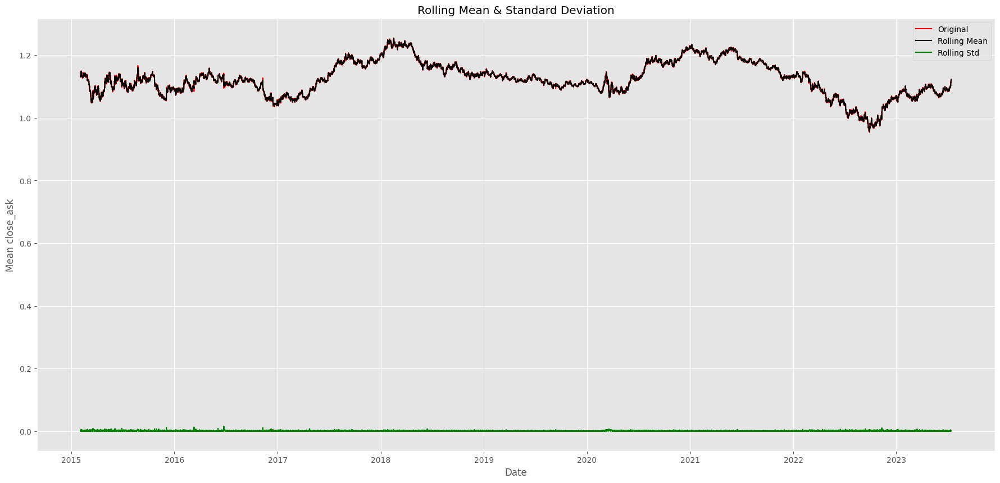

In [7]:
stationary.check('close_ask')
stationary.plot('close_ask')

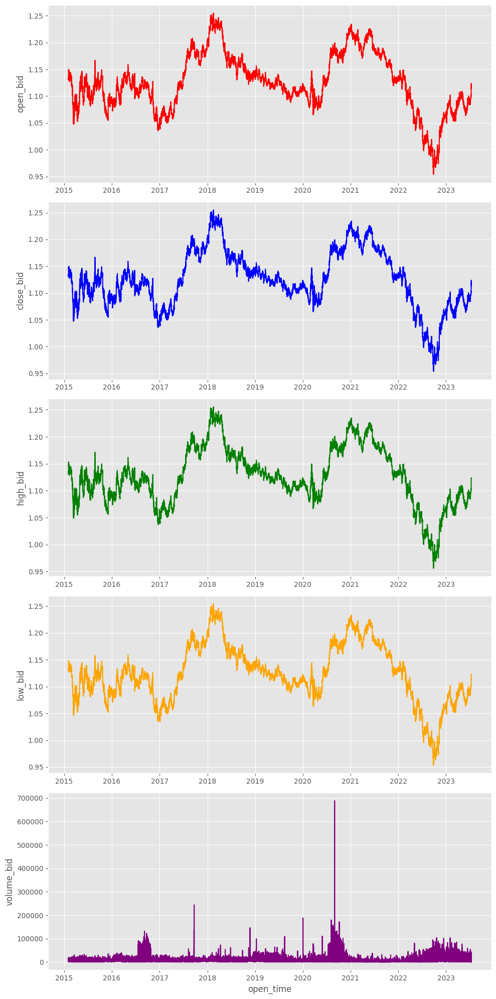

In [8]:
eda.plot_price_volume(market_data, kind = 'bid')

In [9]:
eda.plot_candlestick(market_data, kind = 'bid')

In [10]:
normality_checker = eda.Normality(market_data)
list_of_features_to_be_normalized = []
for col in market_data.columns:
    if normality_checker.check(col):
       continue
    list_of_features_to_be_normalized.append(col)
list_of_features_to_be_normalized 

['Unnamed: 0',
 'open_bid',
 'low_bid',
 'high_bid',
 'close_bid',
 'volume_bid',
 'open_ask',
 'low_ask',
 'high_ask',
 'close_ask',
 'volume_ask',
 'month',
 'year']

# Features Engineering

In [11]:
from src.data.feature_engineering import PercentageFeatureAdder, BollingerBandAdder, TargetAdder,Scalar

percentage_feature_adder = PercentageFeatureAdder(1)
bidbb_adder = BollingerBandAdder(kind = 'bid')
askbb_adder = BollingerBandAdder(kind = 'ask')


pipeline = [bidbb_adder, askbb_adder, percentage_feature_adder]

In [12]:
transformed = market_data.copy()
for idx , trans in enumerate(pipeline):
    print(f'Transformation number: {idx + 1}')
    transformed = trans.transform(transformed)

Transformation number: 1
Transformation number: 2
Transformation number: 3


In [13]:
stationary_checker = eda.Stationary(transformed)
normality_checker = eda.Normality(transformed)

ready_to_train_features = []
for col in transformed.columns:
    if not stationary_checker.check(col) :
       continue
    ready_to_train_features.append(col)

ready_to_train_features

checking stationarity for Unnamed: 0
ADF Statistic: -0.4786964044919784
p-value: 0.8961071336037401
Is stationary: False
checking stationarity for open_bid
ADF Statistic: -2.473211872347423
p-value: 0.12212894590271328
Is stationary: False
checking stationarity for low_bid


ADF Statistic: -2.488818586861005
p-value: 0.11821864083930733
Is stationary: False
checking stationarity for high_bid
ADF Statistic: -2.4839730054906273
p-value: 0.11942272295404788
Is stationary: False
checking stationarity for close_bid
ADF Statistic: -2.487968724873902
p-value: 0.11842917481029186
Is stationary: False
checking stationarity for volume_bid
ADF Statistic: -6.905789751500843
p-value: 1.2483024088338616e-09
Is stationary: True
checking stationarity for open_ask
ADF Statistic: -2.474866432570156
p-value: 0.12170996038703347
Is stationary: False
checking stationarity for low_ask
ADF Statistic: -2.488230007540732
p-value: 0.11836441861345248
Is stationary: False
checking stationarity for high_ask
ADF Statistic: -2.4838623315811272
p-value: 0.11945032929067667
Is stationary: False
checking stationarity for close_ask
ADF Statistic: -2.4895512178110706
p-value: 0.11803736948438237
Is stationary: False
checking stationarity for volume_ask
ADF Statistic: -7.238792104559658
p-va

['volume_bid',
 'volume_ask',
 'month',
 'bid_golden/death',
 'bid_standard_deviation',
 'bid_bollinger_touch',
 'ask_golden/death',
 'ask_standard_deviation',
 'ask_bollinger_touch',
 'hhpc_bid_1',
 'llpc_bid_1',
 'hhpc_bid_3',
 'llpc_bid_3',
 'hplpcp_bid_1',
 'hplpcp_bid_3',
 'hplpcp_bid_4',
 'vvpavg3_bid',
 'vvp3avg3_bid',
 'hc_bid',
 'ho_bid',
 'co_bid',
 'hhpc_ask_1',
 'llpc_ask_1',
 'hhpc_ask_3',
 'llpc_ask_3',
 'hplpcp_ask_1',
 'hplpcp_ask_3',
 'hplpcp_ask_4',
 'vvpavg3_ask',
 'vvp3avg3_ask',
 'hc_ask',
 'ho_ask',
 'co_ask']

In [14]:
target_adder = TargetAdder(step_number=1 , look_back_steps =2)
transformed

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hhpc_ask_3,llpc_ask_3,hplpcp_ask_1,hplpcp_ask_3,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,-0.000564,-0.000194,0.000980,0.001536,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001288,0.000168,0.001164,0.000679,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.001660,-0.000035,0.001800,0.000979,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000379,-0.001200,0.002676,0.001166,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.000625,0.000396,0.002744,0.001800,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000027,-0.000205,0.000499,0.000330,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,-0.000178,-0.000535,0.000561,0.000650,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000374,-0.000169,0.001007,0.000499,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962


In [15]:
target_adder.transform(transformed)

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662,NaN,NaN,NaN,NaN
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635,NaN,NaN,NaN,NaN
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653,0.178263,0.084720,1.13316,1.13314
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830,0.040570,0.229299,1.13391,1.13387
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482,0.200316,-0.002651,1.13320,1.13316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962,0.079290,0.017821,1.12248,1.12244


In [16]:
normality_checker = eda.Normality(transformed.iloc[-2000:])

In [17]:
normality_checker.check('high_bid_change_rate_target')

False

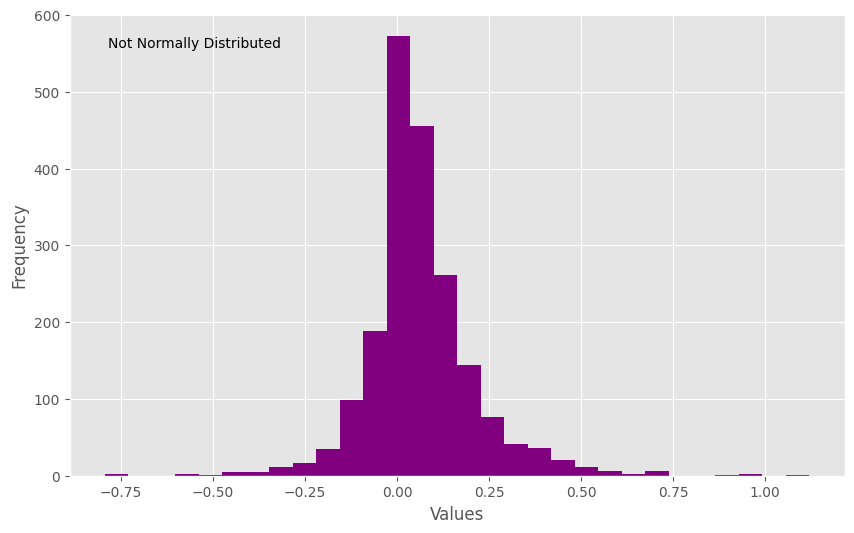

In [18]:
normality_checker.plot('high_bid_change_rate_target')

<Axes: >

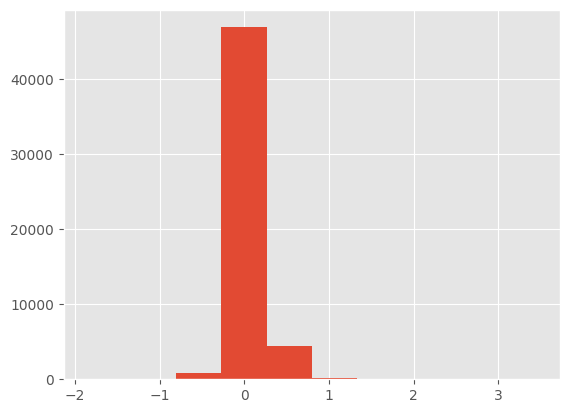

In [19]:
transformed['high_bid_change_rate_target'].hist()

In [20]:
# add retransform method to the target adder (goining from target to abs price) dobe 
# Scaler(Tranformer) , transform and retransform , scale a set of input features (fit, transform, retransform) done 
# Dataset class for your Pytorch model  
# train your model and try to refactor the training code to be re-usable
# evaluatin of models think about adding metrics and plots 
# move the Wavelet to the feature eng part and make it as a Tranformer: implementation done 
#    * denoise input data then make features 
#    * denoise the features directly 
# prepare in the evalutaion part a way to copmare the models performance 
# add the mlp auto-encoder denoiser and try to copmare results ( no-denoising vs wavelet vs auto-encoder) 

In [21]:
transformed.columns

Index(['Unnamed: 0', 'open_bid', 'low_bid', 'high_bid', 'close_bid',
       'volume_bid', 'open_ask', 'low_ask', 'high_ask', 'close_ask',
       'volume_ask', 'month', 'year', 'bid_golden/death',
       'bid_standard_deviation', 'bid_upper_band', 'bid_lower_band',
       'bid_middle_band', 'bid_bollinger_touch', 'ask_golden/death',
       'ask_standard_deviation', 'ask_upper_band', 'ask_lower_band',
       'ask_middle_band', 'ask_bollinger_touch', 'hhpc_bid_1', 'llpc_bid_1',
       'hhpc_bid_3', 'llpc_bid_3', 'hplpcp_bid_1', 'hplpcp_bid_3',
       'hplpcp_bid_4', 'vvpavg3_bid', 'vvp3avg3_bid', 'hc_bid', 'ho_bid',
       'co_bid', 'hhpc_ask_1', 'llpc_ask_1', 'hhpc_ask_3', 'llpc_ask_3',
       'hplpcp_ask_1', 'hplpcp_ask_3', 'hplpcp_ask_4', 'vvpavg3_ask',
       'vvp3avg3_ask', 'hc_ask', 'ho_ask', 'co_ask',
       'high_bid_change_rate_target', 'low_ask_change_rate_target',
       'last_open_ask', 'last_open_bid'],
      dtype='object')

In [22]:
feature=ready_to_train_features
target=['high_bid_change_rate_target', 'low_ask_change_rate_target']

# Models Training

In [23]:
from src.data.dataloader import CreateDataset

my_dataset = CreateDataset(transformed, 10, feature, target)

train_data, valid_data, test_data = my_dataset.dataset_split(0.7,0.2)

In [24]:
from src.data.feature_engineering import Scalar
scalar = Scalar()
train_data[feature] = scalar.fit_transform(train_data[feature])
valid_data[feature] = scalar.transform(valid_data[feature])
test_data[feature] = scalar.transform(test_data[feature])

train_dataset = my_dataset.create_dataset(train_data)
valid_dataset = my_dataset.create_dataset(valid_data)
test_dataset = my_dataset.create_dataset(test_data)

train_loader = my_dataset.create_loader(train_dataset, 128)
valid_loader = my_dataset.create_loader(valid_dataset, 128)
test_loader = my_dataset.create_loader(test_dataset, 128)

In [25]:
DEVICE = 'cuda' 
BATCH_SIZE = 32 
MAX_WAIT = 10
EPOCHS = 25 
LR = 0.001

In [26]:
from src.models import nn_trainer, lstm_forecaster
import torch
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler


rnn_model = lstm_forecaster.RNN(
    input_size = len(feature),
    output_size = 2 
    )

loss_fn = nn.MSELoss() 
optimizer = torch.optim.AdamW(params = rnn_model.parameters() , lr = LR)
scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

In [27]:

train_rnn = nn_trainer.Trainer(rnn_model , optimizer , train_loader , valid_loader, EPOCHS, MAX_WAIT, DEVICE, loss_fn,scheduler)
train_losses , valid_losses = train_rnn.fit()

  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 0
train_loss = 0.030280407196389407
valid_loss = 0.023138202536088157


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 1
train_loss = 0.02995146049054003
valid_loss = 0.023099387272160096


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 2
train_loss = 0.02995249851826682
valid_loss = 0.023113720870789993


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 3
train_loss = 0.02992898581740317
valid_loss = 0.02312187043703105


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 4
train_loss = 0.029932452486213554
valid_loss = 0.023138549459357578


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 5
train_loss = 0.02992265457659313
valid_loss = 0.023135711102331258


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 6
train_loss = 0.029923208807304036
valid_loss = 0.023141379137130744


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 7
train_loss = 0.02992019032373921
valid_loss = 0.023137686084058272


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 8
train_loss = 0.029918769535369292
valid_loss = 0.023135948151978385


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 9
train_loss = 0.02992097140183129
valid_loss = 0.02312824038609144


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 10
train_loss = 0.02998415184750532
valid_loss = 0.023031912727214127


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 11
train_loss = 0.029991126599068392
valid_loss = 0.02302397162013923


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 12
train_loss = 0.029994927457462635
valid_loss = 0.02302271816094058


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 13
train_loss = 0.029995480327569466
valid_loss = 0.023022332974900323


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 14
train_loss = 0.029995393417064205
valid_loss = 0.02302205797666347


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 15
train_loss = 0.02999508940896097
valid_loss = 0.02302177500047059


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 16
train_loss = 0.02999471424360915
valid_loss = 0.023021425429103244


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 17
train_loss = 0.02999418030150183
valid_loss = 0.0230210037700024


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 18
train_loss = 0.029993563394075155
valid_loss = 0.023020460135696166


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 19
train_loss = 0.02999269261151009
valid_loss = 0.023019758041903197


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 20
train_loss = 0.02999635462765582
valid_loss = 0.023019378628940827


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 21
train_loss = 0.029990012403383542
valid_loss = 0.02302035311214536


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 22
train_loss = 0.029985475978012092
valid_loss = 0.023022037263151753


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 23
train_loss = 0.029982181010483246
valid_loss = 0.023024031942912256


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 24
train_loss = 0.029979753692815494
valid_loss = 0.023026094513844294


# Evaluation

In [28]:
from src.eval.metrics import ForecastEval

In [29]:
indexes , high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
indexes_datetime = pd.to_datetime(indexes)
indexes_datetime 

DatetimeIndex(['2022-09-06 01:00:00', '2022-09-06 02:00:00',
               '2022-09-06 03:00:00', '2022-09-06 04:00:00',
               '2022-09-06 05:00:00', '2022-09-06 06:00:00',
               '2022-09-06 07:00:00', '2022-09-06 08:00:00',
               '2022-09-06 09:00:00', '2022-09-06 10:00:00',
               ...
               '2023-07-13 19:00:00', '2023-07-13 20:00:00',
               '2023-07-13 21:00:00', '2023-07-13 22:00:00',
               '2023-07-13 23:00:00', '2023-07-14 00:00:00',
               '2023-07-14 01:00:00', '2023-07-14 02:00:00',
               '2023-07-14 03:00:00', '2023-07-14 04:00:00'],
              dtype='datetime64[ns]', length=5248, freq=None)

In [30]:
predictions = pd.DataFrame(
    data = {
        'high_bid_change_rate_target': high_bid_predictions,
        'low_ask_change_rate_target': low_ask_predictions,
    },
    index = indexes_datetime
)   
predictions[['last_open_ask','last_open_bid']] = test_data[['last_open_ask','last_open_bid']]
predictions.head()

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
2022-09-06 01:00:00,0.064124,0.061329,0.99420,0.99413
2022-09-06 02:00:00,0.064126,0.061314,0.99506,0.99501
2022-09-06 03:00:00,0.064128,0.061300,0.99689,0.99682
2022-09-06 04:00:00,0.064131,0.061140,0.99643,0.99640
2022-09-06 05:00:00,0.064130,0.061183,0.99590,0.99585


In [31]:
predictions = target_adder.retransform(predictions)
predictions

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid,high_bid,low_ask
2022-09-06 01:00:00,0.064124,0.061329,0.99420,0.99413,0.994838,0.993520
2022-09-06 02:00:00,0.064126,0.061314,0.99506,0.99501,0.995698,0.994400
2022-09-06 03:00:00,0.064128,0.061300,0.99689,0.99682,0.997529,0.996209
2022-09-06 04:00:00,0.064131,0.061140,0.99643,0.99640,0.997069,0.995791
2022-09-06 05:00:00,0.064130,0.061183,0.99590,0.99585,0.996539,0.995241
...,...,...,...,...,...,...
2023-07-14 00:00:00,0.064140,0.060443,1.12239,1.12238,1.123110,1.121702
2023-07-14 01:00:00,0.064137,0.060555,1.12250,1.12244,1.123220,1.121760
2023-07-14 02:00:00,0.064129,0.060918,1.12248,1.12244,1.123200,1.121756
2023-07-14 03:00:00,0.064124,0.061207,1.12240,1.12237,1.123120,1.121683


In [32]:
market_data

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,month,year
open_time,,,,,,,,,,,,,
2015-02-02 01:00:00,0,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.700,2,2015
2015-02-02 02:00:00,1,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.250,2,2015
2015-02-02 03:00:00,2,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.550,2,2015
2015-02-02 04:00:00,3,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.470,2,2015
2015-02-02 05:00:00,4,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.400,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,4729.360,7,2023
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,11233.430,7,2023
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,13221.189,7,2023


In [33]:
orginal_test_data = market_data[['open_ask','open_bid','low_ask','high_bid','close_bid','close_ask']].loc[predictions.index]

<Axes: >

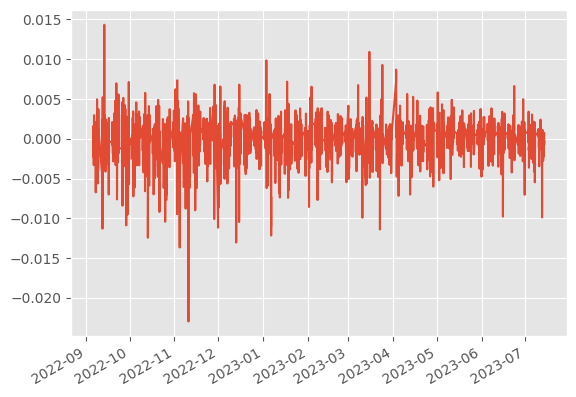

In [34]:
(predictions['high_bid'] - orginal_test_data['high_bid']).plot()

In [35]:
def add_noise_to_feature(feature_data, noise_std):
    noisy_feature_data = feature_data + np.random.normal(0, noise_std, size=feature_data.shape)
    return noisy_feature_data

In [36]:
results = pd.DataFrame(columns=['Feature', 'High Bid Loss', 'Low Ask Loss'])
noise_std = 0.5
for feature_name in feature:
    noisy_data = test_data.copy()
    noisy_feature_data = add_noise_to_feature(noisy_data[feature_name], noise_std)
    noisy_data[feature_name] = noisy_feature_data

    
    test_dataset.features_data = noisy_data[feature].values
    test_loader = my_dataset.create_loader(test_dataset, batch_size=128)


    indexes, high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
    indexes = pd.to_datetime(indexes)
    high_bid_target = test_dataset.target_data[10:][:, 0]  
    low_ask_target = test_dataset.target_data[10:][:, 1]  

    high_bid_loss = loss_fn(torch.tensor(high_bid_predictions), torch.tensor(high_bid_target)).item()
    low_ask_loss = loss_fn(torch.tensor(low_ask_predictions), torch.tensor(low_ask_target)).item()

    
    new_row = {'Feature': feature_name,
               'High Bid Loss': high_bid_loss,
               'Low Ask Loss': low_ask_loss}
    results = pd.concat([results, pd.DataFrame([new_row])], ignore_index=True)

print(results)
    
    


                   Feature  High Bid Loss  Low Ask Loss
0               volume_bid       0.042252      0.040073
1               volume_ask       0.042248      0.040083
2                    month       0.042256      0.040024
3         bid_golden/death       0.042256      0.040026
4   bid_standard_deviation       0.042254      0.040021
5      bid_bollinger_touch       0.042253      0.040023
6         ask_golden/death       0.042253      0.040019
7   ask_standard_deviation       0.042255      0.040022
8      ask_bollinger_touch       0.042255      0.040023
9               hhpc_bid_1       0.042253      0.040015
10              llpc_bid_1       0.042254      0.040025
11              hhpc_bid_3       0.042255      0.040023
12              llpc_bid_3       0.042255      0.040017
13            hplpcp_bid_1       0.042254      0.040020
14            hplpcp_bid_3       0.042253      0.040022
15            hplpcp_bid_4       0.042254      0.040023
16             vvpavg3_bid       0.042255      0

In [37]:
results = pd.DataFrame(columns=['Feature', 'High Bid Loss', 'Low Ask Loss'])
noise_std = 0.5
for feature_name in feature:
    noisy_data = test_data.copy()
    noisy_feature_data = add_noise_to_feature(noisy_data[feature_name], noise_std)
    noisy_data[feature_name] = noisy_feature_data

    test_dataset.features_data = noisy_data[feature].values
    test_loader = my_dataset.create_loader(test_dataset, batch_size=128)

    indexes, high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
    indexes_datetime = pd.to_datetime(indexes)
    
    predictions = pd.DataFrame(
        data = {
            'high_bid_change_rate_target': high_bid_predictions,
            'low_ask_change_rate_target': low_ask_predictions,
        },
        index = indexes_datetime
    )
    
    predictions[['last_open_ask', 'last_open_bid']] = test_data[['last_open_ask', 'last_open_bid']]
    predictions = target_adder.retransform(predictions)
    orginal_test_data = market_data[['low_ask', 'high_bid']].loc[predictions.index]
    
    
    high_bid_diff = abs(predictions['high_bid'] - orginal_test_data['high_bid'])
    low_ask_diff = abs(predictions['low_ask'] - orginal_test_data['low_ask'])
    
    
    high_bid_loss = high_bid_diff.sum()
    low_ask_loss = low_ask_diff.sum()
    
    
    new_row = {'Feature': feature_name,
               'High Bid Loss': high_bid_loss,
               'Low Ask Loss': low_ask_loss}
    results = pd.concat([results, pd.DataFrame([new_row])], ignore_index=True)

print(results)

                   Feature  High Bid Loss  Low Ask Loss
0               volume_bid       7.271150      7.318095
1               volume_ask       7.272328      7.314760
2                    month       7.272130      7.307780
3         bid_golden/death       7.272164      7.308407
4   bid_standard_deviation       7.271999      7.308457
5      bid_bollinger_touch       7.272011      7.308411
6         ask_golden/death       7.272042      7.308591
7   ask_standard_deviation       7.272094      7.307879
8      ask_bollinger_touch       7.272033      7.308076
9               hhpc_bid_1       7.272062      7.308594
10              llpc_bid_1       7.272323      7.307959
11              hhpc_bid_3       7.271896      7.307989
12              llpc_bid_3       7.272011      7.308351
13            hplpcp_bid_1       7.272186      7.307272
14            hplpcp_bid_3       7.272142      7.308094
15            hplpcp_bid_4       7.272044      7.307837
16             vvpavg3_bid       7.272109      7

In [38]:
orginal_test_data = market_data[['open_ask','open_bid','low_ask','high_bid','close_bid','close_ask']].loc[predictions.index]

Position Accuracy: 3.93%
ABS error:  29185.394875160175


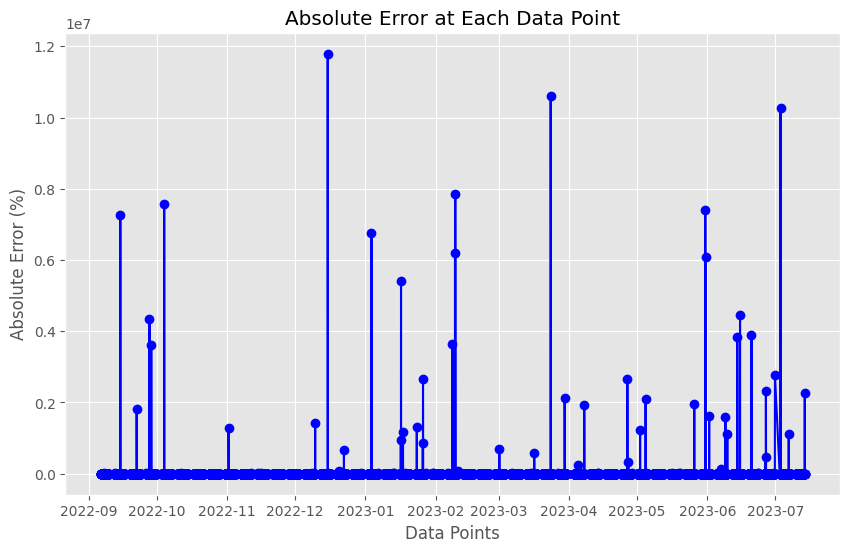

In [39]:
evaluator= ForecastEval(orginal_data= orginal_test_data , predicted_data = predictions)
evaluator.run_evaluation()

In [40]:
(orginal_test_data['high_bid']>predictions['high_bid']).mean()*100

46.57012195121951

In [41]:
(orginal_test_data['low_ask']>predictions['low_ask']).mean()*100

54.706554878048784

In [42]:
predictions

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid,high_bid,low_ask
2022-09-06 01:00:00,0.064123,0.061356,0.99420,0.99413,0.994837,0.993520
2022-09-06 02:00:00,0.064095,0.061468,0.99506,0.99501,0.995698,0.994398
2022-09-06 03:00:00,0.064151,0.061251,0.99689,0.99682,0.997530,0.996209
2022-09-06 04:00:00,0.064175,0.060947,0.99643,0.99640,0.997069,0.995793
2022-09-06 05:00:00,0.064157,0.060985,0.99590,0.99585,0.996539,0.995243
...,...,...,...,...,...,...
2023-07-14 00:00:00,0.064138,0.060325,1.12239,1.12238,1.123110,1.121703
2023-07-14 01:00:00,0.064081,0.060729,1.12250,1.12244,1.123219,1.121758
2023-07-14 02:00:00,0.064177,0.060733,1.12248,1.12244,1.123200,1.121758
2023-07-14 03:00:00,0.064147,0.061059,1.12240,1.12237,1.123120,1.121685


In [43]:
orginal_test_data

,open_ask,open_bid,low_ask,high_bid,close_bid,close_ask
2022-09-06 01:00:00,0.99689,0.99682,0.99615,0.99706,0.99640,0.99646
2022-09-06 02:00:00,0.99643,0.99640,0.99497,0.99642,0.99585,0.99591
2022-09-06 03:00:00,0.99590,0.99585,0.99430,0.99589,0.99440,0.99444
2022-09-06 04:00:00,0.99446,0.99440,0.99443,0.99548,0.99461,0.99466
2022-09-06 05:00:00,0.99467,0.99461,0.99451,0.99649,0.99590,0.99597
...,...,...,...,...,...,...
2023-07-14 00:00:00,1.12248,1.12244,1.12220,1.12280,1.12237,1.12241
2023-07-14 01:00:00,1.12240,1.12237,1.12136,1.12247,1.12229,1.12233
2023-07-14 02:00:00,1.12232,1.12229,1.12224,1.12337,1.12336,1.12340
2023-07-14 03:00:00,1.12339,1.12336,1.12314,1.12386,1.12337,1.12340


In [44]:

predictions=predictions.rename(columns={"high_bid":"predicted.high_bid","low_ask":"predicted.low_ask"})
selected_cols_prediction = predictions[["predicted.high_bid", "predicted.low_ask"]]
selected_cols_original_test = orginal_test_data[["high_bid","low_ask","open_bid", "open_ask","close_bid","close_ask"]]


merged_data = pd.concat([selected_cols_prediction, selected_cols_original_test], axis=1)

print(merged_data)







                     predicted.high_bid  predicted.low_ask  high_bid  low_ask  \
2022-09-06 01:00:00            0.994837           0.993520   0.99706  0.99615   
2022-09-06 02:00:00            0.995698           0.994398   0.99642  0.99497   
2022-09-06 03:00:00            0.997530           0.996209   0.99589  0.99430   
2022-09-06 04:00:00            0.997069           0.995793   0.99548  0.99443   
2022-09-06 05:00:00            0.996539           0.995243   0.99649  0.99451   
...                                 ...                ...       ...      ...   
2023-07-14 00:00:00            1.123110           1.121703   1.12280  1.12220   
2023-07-14 01:00:00            1.123219           1.121758   1.12247  1.12136   
2023-07-14 02:00:00            1.123200           1.121758   1.12337  1.12224   
2023-07-14 03:00:00            1.123120           1.121685   1.12386  1.12314   
2023-07-14 04:00:00            1.123040           1.121605   1.12344  1.12339   

                     open_b

In [45]:

from src.eval.forecast_features_adder import ForecastsAggergator, ForecastMetricsAdder
aggregator = ForecastsAggergator(quantiles=[0.5])
merged_data = aggregator.transform(merged_data)
merged_data

,high_bid,low_ask,open_bid,open_ask,close_bid,close_ask,high_q50,low_q50,high_q50_pct,high_pct,low_q50_pct,low_pct
2022-09-06 01:00:00,0.99706,0.99615,0.99682,0.99689,0.99640,0.99646,0.994837,0.993520,NaN,NaN,NaN,NaN
2022-09-06 02:00:00,0.99642,0.99497,0.99640,0.99643,0.99585,0.99591,0.995698,0.994398,-0.076492,-0.004014,0.200883,0.143514
2022-09-06 03:00:00,0.99589,0.99430,0.99585,0.99590,0.99440,0.99444,0.997530,0.996209,0.162619,-0.002005,-0.036088,0.155648
2022-09-06 04:00:00,0.99548,0.99443,0.99440,0.99446,0.99461,0.99466,0.997069,0.995793,0.264412,0.104580,-0.140054,-0.003015
2022-09-06 05:00:00,0.99649,0.99451,0.99461,0.99467,0.99590,0.99597,0.996539,0.995243,0.188898,0.183981,-0.063612,0.010056
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,1.12280,1.12220,1.12244,1.12248,1.12237,1.12241,1.123110,1.121703,0.055222,0.027612,0.065663,0.021379
2023-07-14 01:00:00,1.12247,1.12136,1.12237,1.12240,1.12229,1.12233,1.123219,1.121758,0.072094,0.005342,0.054498,0.089994
2023-07-14 02:00:00,1.12337,1.12224,1.12229,1.12232,1.12336,1.12340,1.123200,1.121758,0.077558,0.092673,0.047379,0.004461
2023-07-14 03:00:00,1.12386,1.12314,1.12336,1.12339,1.12337,1.12340,1.123120,1.121685,-0.024919,0.040950,0.149137,0.019589


In [46]:
merged_data.reset_index(drop=False, inplace=True)


merged_data.rename(columns={'index': 'open_time'}, inplace=True)



In [47]:
metricsadder=ForecastMetricsAdder(quantiles=[0.5])
metric_data=metricsadder._add_metrics(merged_data)
metric_data

,open_time,high_q50_error,high_q50_abs_error,high_q50_pct_error,high_q50_abs_pct_error,high_q50_accuracy,low_q50_error,low_q50_abs_error,low_q50_pct_error,low_q50_abs_pct_error,low_q50_accuracy
0,2022-09-06 01:00:00,-0.002223,0.002223,NaN,NaN,0,0.002630,0.002630,NaN,NaN,0
1,2022-09-06 02:00:00,-0.000722,0.000722,-0.072478,0.072478,1,0.000572,0.000572,0.057368,0.057368,0
2,2022-09-06 03:00:00,0.001640,0.001640,0.164624,0.164624,0,-0.001909,0.001909,-0.191736,0.191736,1
3,2022-09-06 04:00:00,0.001589,0.001589,0.159832,0.159832,0,-0.001363,0.001363,-0.137039,0.137039,1
4,2022-09-06 05:00:00,0.000049,0.000049,0.004918,0.004918,1,-0.000733,0.000733,-0.073668,0.073668,1
...,...,...,...,...,...,...,...,...,...,...,...
5243,2023-07-14 00:00:00,0.000310,0.000310,0.027610,0.027610,0,0.000497,0.000497,0.044284,0.044284,0
5244,2023-07-14 01:00:00,0.000749,0.000749,0.066752,0.066752,0,-0.000398,0.000398,-0.035496,0.035496,1
5245,2023-07-14 02:00:00,-0.000170,0.000170,-0.015115,0.015115,1,0.000482,0.000482,0.042918,0.042918,0
5246,2023-07-14 03:00:00,-0.000740,0.000740,-0.065869,0.065869,1,0.001455,0.001455,0.129547,0.129547,0


In [48]:
from src.eval.plots import *

d,t = prepare_summary_reports(metric_data)
t.show()

In [49]:
metric="abs_error"
metric_data['open_time'] = pd.to_datetime(metric_data['open_time'])
metric_data.set_index('open_time', inplace=True)


In [50]:
metric_mean_plot(metric_data, metric, period="D")

In [51]:
resduial_error(metric_data, side="high")

In [52]:
merged_data['open_avg'] = (merged_data['open_ask'] + merged_data['open_bid']) / 2
merged_data['close_avg'] = (merged_data['close_ask'] + merged_data['close_bid']) / 2
plot_candlestick(merged_data, year=2023)